In [1]:
import numpy as np
import pandas as pd
import skimage
print(skimage.__version__)

0.13.1


In [2]:
!ls

datalab


In [0]:
# FULL RESTART
#!kill -9 -1

# Misc info

In [0]:
url = 'http://vision.stanford.edu/aditya86/ImageNetDogs/'
num_classes = 120


# Sub-features

In [0]:
#Create folders
import os
def folder_create(path):
    os.makedirs(os.path.join(path), exist_ok=True)

In [0]:
#Dowload files
from six.moves.urllib.request import urlretrieve
def downloadfile(filename, targetloc='.', url=url):
    dest_filename = os.path.join(targetloc, filename)
    filename, _ = urlretrieve(url + filename, dest_filename)
    print(dest_filename, 'created')
    return filename

In [0]:
#Extract files
import tarfile
import sys
def extract(filename, target, location = '.'):
    
    tar = tarfile.open(filename)
    sys.stdout.flush()
    tar.extractall(target)
    tar.close()
    print(filename, 'created')

# dataset preparation

## Folder creation

In [0]:
# Folder creation
folder_create('lists')
folder_create('train')
folder_create('test')
folder_create('features')
folder_create('Annotation')

## downloading

In [9]:
#Datadownloading
downloadfile('lists.tar')
downloadfile('annotation.tar')
downloadfile('images.tar')
#downloadfile('train_data.mat', targetloc = 'features')
#downloadfile('test_data.mat', targetloc = 'features')

./lists.tar created
./annotation.tar created
./images.tar created


'./images.tar'

## Data preparation

In [10]:
#File extraction
extract('lists.tar', target='lists/')
extract('annotation.tar', target='.')
extract('images.tar', target='.')

lists.tar created
annotation.tar created
images.tar created


In [11]:
!ls

Annotation	datalab   Images      lists	 test
annotation.tar	features  images.tar  lists.tar  train


In [12]:
import scipy.io as sio
test_list = sio.loadmat('lists/test_list.mat')
train_list = sio.loadmat('lists/train_list.mat')
test_list.keys()

dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels'])

In [0]:
from bs4 import BeautifulSoup
from skimage.io import imread, imsave
from skimage import transform

def spreadfiles(listmat, serie=None, annotation='Annotation', images='Images'):
    counter = 0
    for filepath in listmat['file_list']:
        counter +=1
        if counter % 500 == 0:
            print(f'{counter} files done')
        cleanedfilepath = filepath[0][0]
        filename = os.path.split(cleanedfilepath)[-1].split('.')[0]
        foldername = os.path.split(cleanedfilepath)[0]
        details = {}
        with open(os.path.join(annotation, foldername, filename), 'r', encoding='utf-8') as f:
            soup = BeautifulSoup(f, 'html.parser')
            dog = soup.find('object')
            details['xmin'] = int(dog.xmin.string)
            details['xmax'] = int(dog.xmax.string)
            details['ymin'] = int(dog.ymin.string)
            details['ymax'] = int(dog.ymax.string)
            #details['breed'] = dog.find_all('name')[0].string
        #print(os.path.join(images, foldername, f'{filename}.jpg'))
        image_data = imread(os.path.join(images, foldername, f'{filename}.jpg'))
        new_image_data = image_data[details['ymin']:details['ymax'],details['xmin']:details['xmax'],:]
        newpath = os.path.join(serie, foldername)
        #print(newpath)
        folder_create(newpath)
        try:
            imsave(os.path.join(newpath, f'{filename}.jpg'), new_image_data)
        except:
            print(f'problem with {filename} :-(')


In [14]:
%%time
spreadfiles(test_list, serie='test')



500 files done
1000 files done
1500 files done
2000 files done
2500 files done
3000 files done
3500 files done
4000 files done
4500 files done
5000 files done
5500 files done
6000 files done
6500 files done
7000 files done
7500 files done
8000 files done
8500 files done
CPU times: user 1min 53s, sys: 1.52 s, total: 1min 55s
Wall time: 1min 55s


In [15]:
%%time
spreadfiles(train_list, serie='train')

500 files done
1000 files done
1500 files done
2000 files done
2500 files done
3000 files done
3500 files done
4000 files done
4500 files done
5000 files done
5500 files done
6000 files done
6500 files done
7000 files done
7500 files done
8000 files done
8500 files done
9000 files done
9500 files done
10000 files done
10500 files done
11000 files done
11500 files done
12000 files done
CPU times: user 2min 41s, sys: 2.03 s, total: 2min 43s
Wall time: 2min 43s


# Resnet50

In [37]:
import numpy as np
import keras
from keras.models import Model
from keras.layers import Dense, Dropout, Flatten
print(keras.__version__)

2.1.6


In [0]:
image_size = 224
num_class = 120
batch_size = 32
num_channels = 3
train_data_dir = 'train'
validation_data_dir = 'test'

In [18]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(#rotation_range=40,
                                   #shear_range=0.2,
                                   #channel_shift_range=20,
                                   #width_shift_range=0.2,
                                   #height_shift_range=0.2,
                                   #zoom_range=0.2,
                                   #horizontal_flip=True,
                                   #rescale=1./255,
                                    )

test_datagen = ImageDataGenerator() #rescale=1./255

train_generator = train_datagen.flow_from_directory(train_data_dir,
                                                    target_size=(image_size,image_size),
                                                    class_mode='categorical',
                                                    batch_size=batch_size)

validation_generator = test_datagen.flow_from_directory(validation_data_dir, 
                                                        target_size=(image_size,image_size),
                                                        class_mode='categorical',
                                                        batch_size=batch_size)

Found 12000 images belonging to 120 classes.
Found 8580 images belonging to 120 classes.


## Baseline

In [0]:
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
import os 

In [19]:
baseline = ResNet50(include_top=True, weights='imagenet')
baseline.summary()

102858752/102853048 [==============================] - 11s 0us/step
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
_________________________________________

In [20]:
pred = []
for img_path in validation_generator.filenames:
    img = image.load_img(os.path.join(validation_generator.directory, img_path), target_size=(image_size, image_size))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0) #To add a dimension
    x = preprocess_input(x)

    preds = baseline.predict(x)
    readable = decode_predictions(preds, top=1)[0][0]
    code, breed, acc = decode_predictions(preds, top=1)[0][0]
    # decode the results into a list of tuples (class, description, probability)
    pred.append(validation_generator.class_indices.get(f'{code}-{breed}',-1))
    #print('Predicted:', readable)
pred[:10]

40960/35363 [==================================] - 0s 4us/step


[0, 0, 0, 0, 0, 0, 0, 0, 102, 0]

In [21]:
from sklearn.metrics import accuracy_score
accuracy_score(validation_generator.classes, pred)

0.843006993006993

In [22]:
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
generator = datagen.flow_from_directory(train_data_dir, 
                                                        target_size=(image_size,image_size),
                                                        class_mode=None,
                                                        batch_size=batch_size,
                                                       shuffle=False)

preds = baseline.predict_generator(generator)

Found 12000 images belonging to 120 classes.


In [23]:
import pandas as pd

df = pd.DataFrame({'120cl':generator.classes,
                   '1000cl':np.argmax(preds,axis=1)})
df.head()

,1000cl,120cl
0,151,0
1,151,0
2,253,0
3,739,0
4,151,0


In [35]:
#Index in which I'm interrested
newindex = df.groupby('120cl').agg(lambda x:x.value_counts().index[0])['1000cl'].tolist()
df.groupby('120cl').agg(lambda x:x.value_counts().index[0]).head()

,1000cl
120cl,
0,151
1,152
2,153
3,154
4,155


In [0]:
#Weights from complete model
originalweights = baseline.get_layer('fc1000').get_weights()

In [83]:
weight = originalweights[0][:,np.array(newindex)]
weight.shape

(2048, 120)

In [84]:
bias = originalweights[1][newindex]
bias.shape

(120,)

In [0]:
dogweight = [weight, bias]

## Transfer learning - Bottlneck

In [0]:
from keras.utils.np_utils import to_categorical
from keras.models import Sequential, Model

In [0]:
tr_model=ResNet50(include_top=False,
                  weights='imagenet',
                 input_shape = (224, 224, 3),
                 ) #
#tr_model.summary()

In [0]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(preprocessing_function=preprocess_input) #rescale=1. / 255

In [89]:
# training set
train_generator = datagen.flow_from_directory(train_data_dir,
                                                    target_size=(image_size,image_size),
                                                    class_mode=None,
                                                    batch_size=batch_size,
                                                    shuffle=False)

bottleneck_features_train = tr_model.predict_generator(train_generator)
train_labels = to_categorical(train_generator.classes , num_classes=num_class)


Found 12000 images belonging to 120 classes.


In [90]:
# Validation set
validation_generator = datagen.flow_from_directory(validation_data_dir, 
                                                        target_size=(image_size,image_size),
                                                        class_mode=None,
                                                        batch_size=batch_size,
                                                       shuffle=False)

bottleneck_features_validation = tr_model.predict_generator(validation_generator)
validation_labels = to_categorical(validation_generator.classes, num_classes=num_class)

Found 8580 images belonging to 120 classes.


In [91]:
print(bottleneck_features_train.shape)
print(bottleneck_features_validation.shape)

(12000, 1, 1, 2048)
(8580, 1, 1, 2048)


In [92]:
print(train_labels.shape)
print(validation_labels.shape)

(12000, 120)
(8580, 120)


In [134]:
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense, Dropout, Flatten, Activation, BatchNormalization, regularizers
model = Sequential()
model.add(Flatten(input_shape=bottleneck_features_train.shape[1:]))
#model.add(Dense(1024, activation='relu'))

#model.add(BatchNormalization())
#model.add(Dropout(0.85))

model.add(Dense(num_class, activation='softmax', name='pred'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_12 (Flatten)         (None, 2048)              0         
_________________________________________________________________
pred (Dense)                 (None, 120)               245880    
Total params: 245,880
Trainable params: 245,880
Non-trainable params: 0
_________________________________________________________________


In [0]:
#model.get_layer('pred').set_weights(dogweight)


In [0]:
# Early stop
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping
early = EarlyStopping(monitor='val_acc', min_delta=0, patience=3, verbose=1, mode='auto')


In [136]:
history = model.fit(bottleneck_features_train, train_labels,
          epochs=15,
          batch_size=batch_size,
          validation_data=(bottleneck_features_validation, validation_labels),
                   callbacks = [early])

Train on 12000 samples, validate on 8580 samples
Epoch 1/15
12000/12000 [==============================] - 7s 577us/step - loss: 1.4161 - acc: 0.6362 - val_loss: 0.7647 - val_acc: 0.7709
Epoch 2/15
12000/12000 [==============================] - 3s 272us/step - loss: 0.4513 - acc: 0.8665 - val_loss: 0.7027 - val_acc: 0.7861
Epoch 3/15
12000/12000 [==============================] - 3s 273us/step - loss: 0.2736 - acc: 0.9233 - val_loss: 0.6899 - val_acc: 0.7907
Epoch 4/15
12000/12000 [==============================] - 3s 274us/step - loss: 0.1691 - acc: 0.9594 - val_loss: 0.6522 - val_acc: 0.7993
Epoch 5/15
11776/12000 [============================>.] - ETA: 0s - loss: 0.1107 - acc: 0.9755

12000/12000 [==============================] - 3s 274us/step - loss: 0.1102 - acc: 0.9759 - val_loss: 0.6336 - val_acc: 0.8103
Epoch 6/15
12000/12000 [==============================] - 3s 277us/step - loss: 0.0766 - acc: 0.9867 - val_loss: 0.6292 - val_acc: 0.8094
Epoch 7/15
12000/12000 [==============================] - 3s 278us/step - loss: 0.0566 - acc: 0.9912 - val_loss: 0.6312 - val_acc: 0.8132
Epoch 8/15
12000/12000 [==============================] - 3s 280us/step - loss: 0.0428 - acc: 0.9943 - val_loss: 0.6617 - val_acc: 0.8077
Epoch 9/15
12000/12000 [==============================] - 3s 275us/step - loss: 0.0341 - acc: 0.9957 - val_loss: 0.6621 - val_acc: 0.8139
Epoch 10/15
 5024/12000 [===========>..................] - ETA: 1s - loss: 0.0250 - acc: 0.9982

12000/12000 [==============================] - 3s 277us/step - loss: 0.0266 - acc: 0.9972 - val_loss: 0.7072 - val_acc: 0.7998
Epoch 11/15
12000/12000 [==============================] - 3s 278us/step - loss: 0.0249 - acc: 0.9963 - val_loss: 0.6758 - val_acc: 0.8132
Epoch 12/15
12000/12000 [==============================] - 3s 278us/step - loss: 0.0194 - acc: 0.9978 - val_loss: 0.6827 - val_acc: 0.8119
Epoch 00012: early stopping


In [143]:
weights = model.get_layer('pred').get_weights()
np.savez('weights', weights=weights)
#files.download('weights.npz')

model.get_layer('pred').get_config()

{'activation': 'softmax',
 'activity_regularizer': None,
 'bias_constraint': None,
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'bias_regularizer': None,
 'kernel_constraint': None,
 'kernel_initializer': {'class_name': 'VarianceScaling',
  'config': {'distribution': 'uniform',
   'mode': 'fan_avg',
   'scale': 1.0,
   'seed': None}},
 'kernel_regularizer': None,
 'name': 'pred',
 'trainable': True,
 'units': 120,
 'use_bias': True}

In [0]:
model.save('bn_resnet50.h5')

from google.colab import files

files.download('bn_resnet50.h5')

In [0]:
model.save_weights('model_weights.h5')
files.download('model_weights.h5')

In [0]:
# serialize model to YAML
from keras.models import model_from_yaml
model_yaml = model.to_yaml()
with open("model.yaml", "w") as yaml_file:
    yaml_file.write(model_yaml)
files.download('model.yaml')

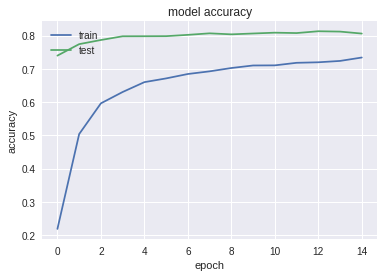

In [120]:
import matplotlib.pyplot as plt
import numpy

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

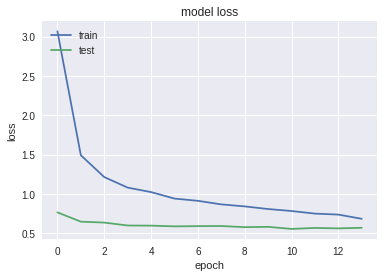

In [109]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Data analysis

In [0]:
pred_probas = model.predict(bottleneck_features_validation)

In [0]:
#Misc value
maxval = [arr[index] for arr, index in zip(pred_probas, np.argsort(pred_probas, axis=1)[:,-1])]
predict = np.argsort(pred_probas, axis=1)[:,-1]
secondval = [arr[index] for arr, index in zip(pred_probas, np.argsort(pred_probas, axis=1)[:,-2])]

In [0]:
indexlabel = {v:k[10:] for k,v in train_generator.class_indices.items()}

In [113]:
import pandas as pd
resultset = pd.DataFrame(data=pred_probas, columns = range(len(indexlabel)))
resultset = pd.concat([resultset, pd.DataFrame(data={'True': validation_generator.classes,
                                                     'maxval' : maxval,
                                                     'predict': predict,
                                                     'secondval': secondval,
                                                     #'breedname': X_test.breedname.tolist(),
                                                     'filepath': validation_generator.filenames})], axis=1)
resultset['correct'] = resultset['True'] == resultset['predict']
resultset['breedname'] = resultset['True'].apply(lambda x: indexlabel.get(x, -1))
resultset['diff'] = resultset['maxval'] - resultset['secondval']
resultset.head()

,0,1,2,3,4,5,6,7,8,9,...,118,119,True,filepath,maxval,predict,secondval,correct,breedname,diff
0,0.993863,2.019505e-06,3.374941e-07,1.181737e-05,6.213759e-08,1.369820e-06,0.000005,0.000361,1.010098e-07,8.046233e-08,...,8.905545e-06,2.140958e-06,0,n02085620-Chihuahua/n02085620_10074.jpg,0.993863,0,0.004693,True,Chihuahua,0.989170
1,0.998752,6.205330e-07,7.847134e-08,1.412451e-06,5.228994e-08,1.561037e-05,0.000407,0.000311,3.456648e-08,2.608761e-09,...,2.303135e-05,7.265848e-08,0,n02085620-Chihuahua/n02085620_10131.jpg,0.998752,0,0.000407,True,Chihuahua,0.998345
2,0.969792,1.657286e-05,8.956549e-06,2.071027e-05,3.137084e-06,1.032319e-05,0.000006,0.005077,3.837965e-06,3.093372e-07,...,2.922063e-04,1.177442e-04,0,n02085620-Chihuahua/n02085620_1073.jpg,0.969792,0,0.008305,True,Chihuahua,0.961487
3,0.967751,2.051494e-05,2.170491e-03,8.959140e-07,5.908859e-07,1.380016e-06,0.000011,0.000569,3.570134e-06,1.287043e-07,...,7.843296e-06,3.767168e-06,0,n02085620-Chihuahua/n02085620_11337.jpg,0.967751,0,0.019025,True,Chihuahua,0.948726
4,0.995199,4.356272e-07,1.317824e-05,6.046411e-07,6.472871e-08,6.479303e-07,0.000046,0.003087,3.532669e-08,7.276243e-08,...,9.965591e-08,2.391744e-06,0,n02085620-Chihuahua/n02085620_11477.jpg,0.995199,0,0.003087,True,Chihuahua,0.992112


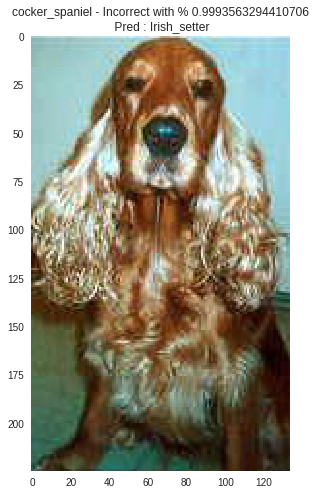

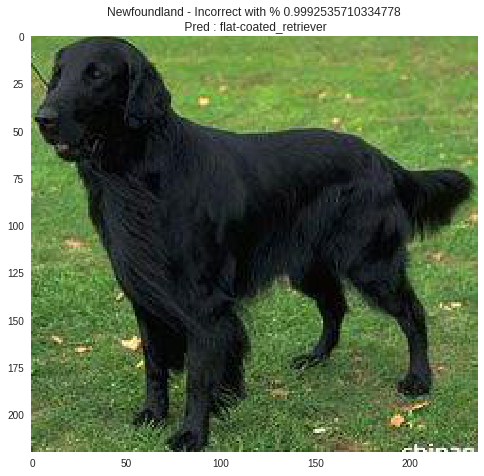

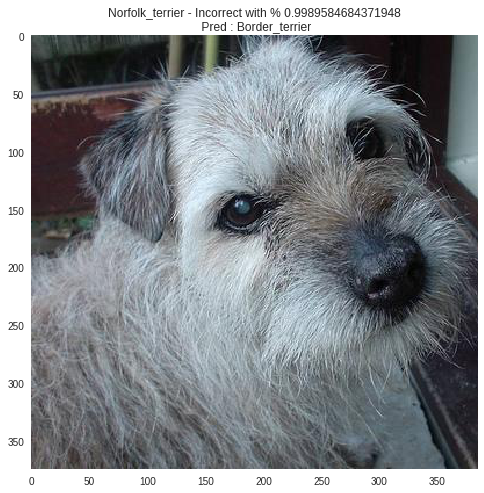

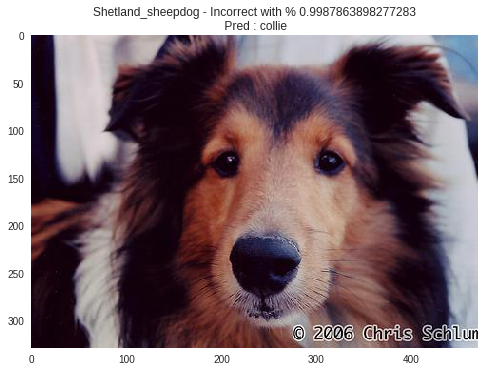

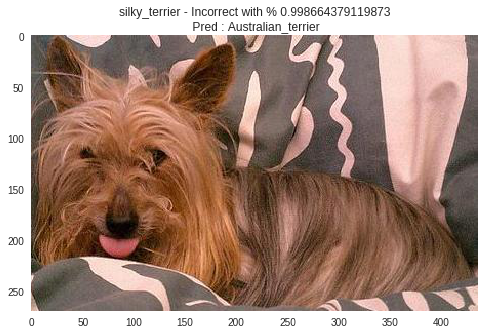

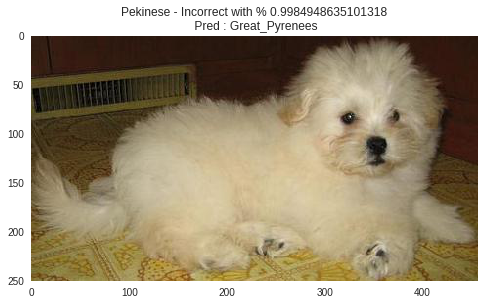

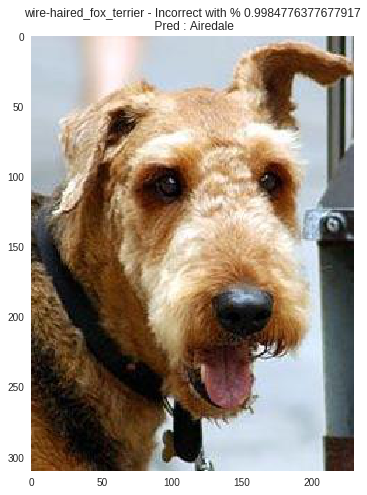

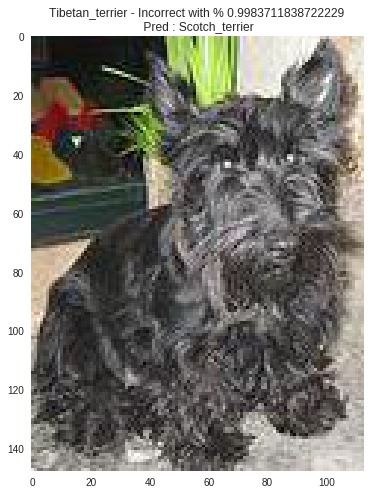

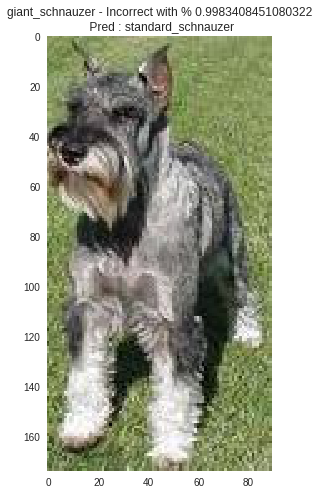

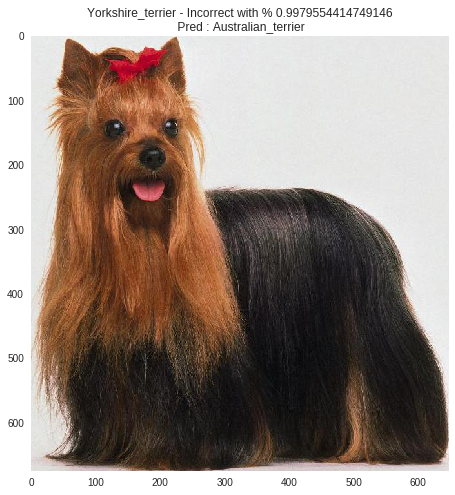

In [114]:
#Most wrong
%matplotlib inline
ds = resultset[np.logical_not(resultset['correct'])]
ds = ds.sort_values('maxval', ascending=False)
for index, line in ds[:10].iterrows():
    toopen = 'test/{}'.format(line.filepath)
    
    if toopen:
        plt.figure(figsize=(8,8))
        picture = imread(toopen)
        plt.imshow(picture)
        plt.grid(False)
        plt.title('{} - Incorrect with % {}\n Pred : {}'.format(line.breedname, line.maxval, indexlabel.get(line.predict)))
        plt.show()
    else:
        print('Picture not found')

    #print('{} - Correct with % {}'.format(line.breedname, line.maxval))

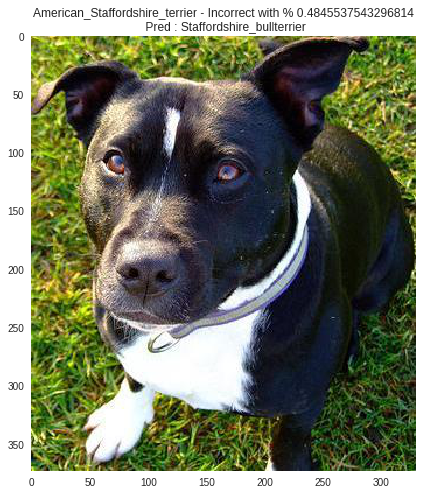

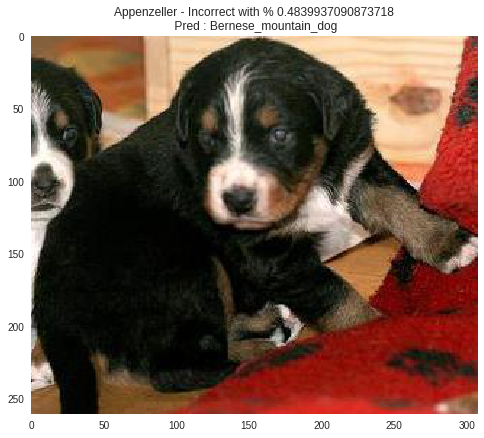

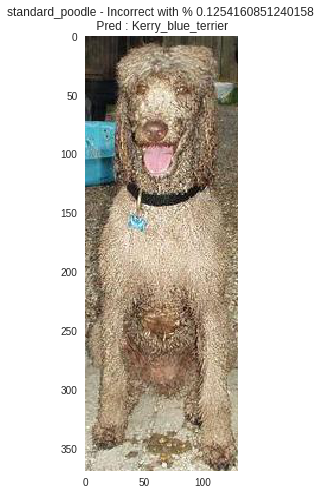

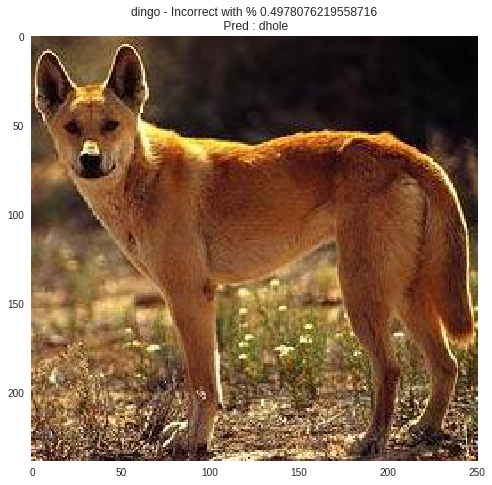

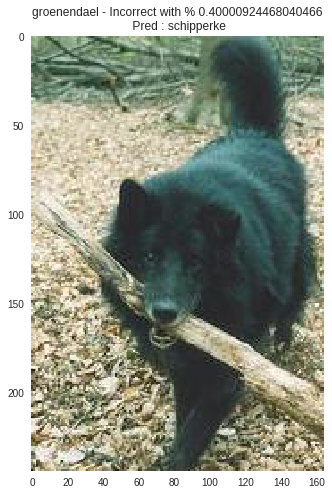

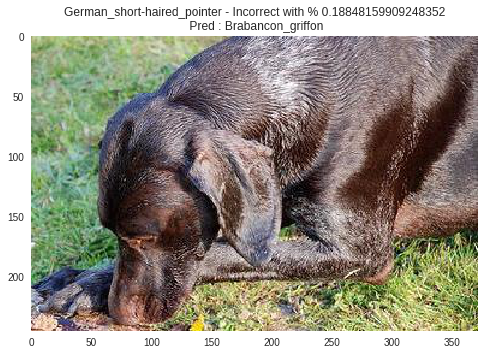

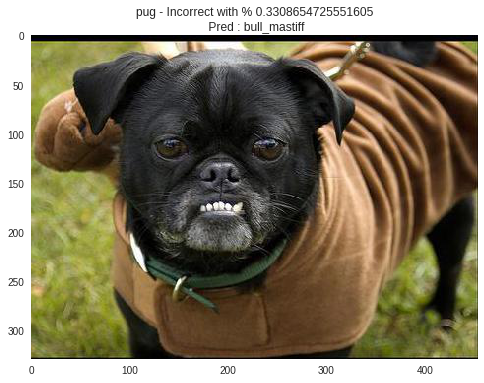

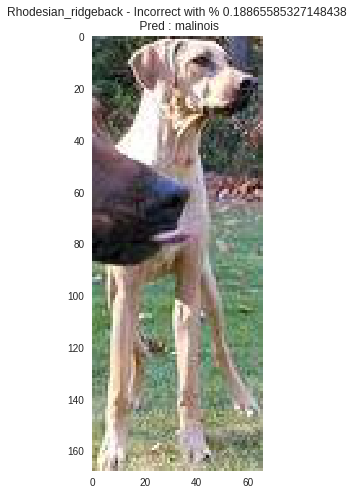

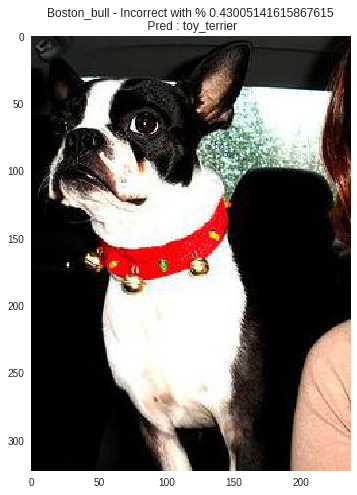

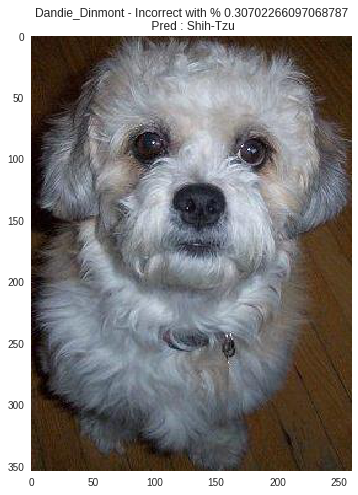

In [115]:
#Most uncertain WRONG
%matplotlib inline
ds = resultset[np.logical_not(resultset['correct'])]
ds = ds.sort_values('diff', ascending=True)
for index, line in ds[:10].iterrows():
    toopen = 'test/{}'.format(line.filepath)
    
    if toopen:
        plt.figure(figsize=(8,8))
        picture = imread(toopen)
        plt.imshow(picture)
        plt.grid(False)
        plt.title('{} - Incorrect with % {}\n Pred : {}'.format(line.breedname, line.maxval, indexlabel.get(line.predict)))
        plt.show()
    else:
        print('Picture not found')

    #print('{} - Correct with % {}'.format(line.breedname, line.maxval))

## Data augmentation

In [0]:
samplesize = 50

In [66]:
# dowsampling to 50 classes
import shutil

np.random.seed(0)
indextokeep = np.random.choice(50, samplesize, replace=False)
for index, folder in enumerate(os.listdir('test')):
    if index not in indextokeep:
        print(folder)
        shutil.rmtree(os.path.join('test', folder))
        shutil.rmtree(os.path.join('train', folder))

n02097298-Scotch_terrier
n02088094-Afghan_hound
n02107683-Bernese_mountain_dog
n02090622-borzoi
n02105162-malinois
n02115913-dhole
n02100583-vizsla
n02091635-otterhound
n02087046-toy_terrier
n02096437-Dandie_Dinmont
n02098105-soft-coated_wheaten_terrier
n02113023-Pembroke
n02111889-Samoyed
n02097130-giant_schnauzer
n02088238-basset
n02107142-Doberman
n02099601-golden_retriever
n02108000-EntleBucher
n02099267-flat-coated_retriever
n02112706-Brabancon_griffon
n02112350-keeshond
n02096177-cairn
n02110806-basenji
n02098413-Lhasa
n02102177-Welsh_springer_spaniel
n02092339-Weimaraner
n02100735-English_setter
n02097658-silky_terrier
n02092002-Scottish_deerhound
n02100236-German_short-haired_pointer
n02093256-Staffordshire_bullterrier
n02116738-African_hunting_dog
n02105855-Shetland_sheepdog
n02098286-West_Highland_white_terrier
n02111500-Great_Pyrenees
n02085782-Japanese_spaniel
n02110185-Siberian_husky
n02105505-komondor
n02106166-Border_collie
n02086240-Shih-Tzu
n02095570-Lakeland_terrier
n

In [122]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(#rotation_range=30,
                                   #shear_range=0.2,
                                   #channel_shift_range=20,
                                   #width_shift_range=0.2,
                                   #height_shift_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   #rescale=1./255,
                                   preprocessing_function=preprocess_input
                                    )

validation_datagen = ImageDataGenerator(#rescale=1./255,
                                        preprocessing_function=preprocess_input)


train_generator = train_datagen.flow_from_directory(train_data_dir,
                                                    target_size=(image_size,image_size),
                                                    class_mode='categorical',
                                                    batch_size=batch_size,
                                                    shuffle=True)
validation_generator = validation_datagen.flow_from_directory(validation_data_dir, 
                                                        target_size=(image_size,image_size),
                                                        class_mode='categorical',
                                                        batch_size=batch_size,
                                                       shuffle=False)

Found 12000 images belonging to 120 classes.
Found 8580 images belonging to 120 classes.


In [123]:
da_model=ResNet50(include_top=False,
                  weights='imagenet',
                 input_shape = (224, 224, 3),
                 )

da_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [0]:
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense, Dropout, Flatten, Activation, BatchNormalization, regularizers

#Adding custom Layers 
last_layer = da_model.output
x = Flatten()(last_layer)
x = Dense(1024, activation="relu", name='ds1')(x)
x = BatchNormalization(name = 'bn')(x)
x = Dropout(0.75, name='do1')(x)

#x = Dense(1024, activation="relu", name='ds2')(x)

# add a global spatial average pooling layer
# add fully-connected & dropout layers
#x = Dense(512, activation='relu',name='fc-1')(x)
#x = Dropout(0.5)(x)
#x = Dense(256, activation='relu',name='fc-2')(x)
#x = Dropout(0.5)(x)


predictions = Dense(samplesize, activation="softmax", name='pred')(x)

In [0]:
# creating the final model 
model_final = Model(inputs = da_model.input, outputs = predictions)
#model_final.summary()

In [0]:
#model_final.get_layer('pred').set_weights(dogweight)

In [127]:
# Freeze the layers which you don't want to train. 
layernum = 0
for layer in model_final.layers[::-1]:
    layernum += 1
    if layer.name in ['ds1', 'ds2', 'pred', 'do1', 'bn', 'res5c_branch2c', 'bn5c_branch2c', 'res5c_branch2a', 'bn5c_branch2a', 'res5c_branch2b', 'bn5c_branch2b']:
        layer.trainable = True
        print('trainable  --> ', layer.name)
    else:
        layer.trainable = False
#model_final.summary()

trainable  -->  pred
trainable  -->  do1
trainable  -->  bn
trainable  -->  ds1
trainable  -->  bn5c_branch2c
trainable  -->  res5c_branch2c
trainable  -->  bn5c_branch2b
trainable  -->  res5c_branch2b
trainable  -->  bn5c_branch2a
trainable  -->  res5c_branch2a


In [0]:
# Early stop
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping
early = EarlyStopping(monitor='val_acc', min_delta=0, patience=3, verbose=1, mode='auto')

# compile the model 
model_final.compile(loss = 'categorical_crossentropy',
                     optimizer = 'adam', #optimizers.SGD(lr=0.001),
                     metrics=["acc"])

In [129]:
# Train the model 

history = model_final.fit_generator(
        train_generator,
        epochs = 20,
        steps_per_epoch=len(train_generator.filenames) // batch_size,
        validation_steps=len(validation_generator.filenames) // batch_size,
        #workers=4,
        validation_data = validation_generator,
        callbacks = [early]
         )

Epoch 1/20
375/375 [==============================] - 295s 786ms/step - loss: 2.8229 - acc: 0.3481 - val_loss: 1.5204 - val_acc: 0.6082
Epoch 2/20
287/375 [=====================>........] - ETA: 44s - loss: 1.5514 - acc: 0.5646

375/375 [==============================] - 288s 768ms/step - loss: 1.5334 - acc: 0.5673 - val_loss: 1.3064 - val_acc: 0.6621
Epoch 3/20
375/375 [==============================] - 289s 770ms/step - loss: 1.2430 - acc: 0.6397 - val_loss: 1.0479 - val_acc: 0.7018
Epoch 4/20
 31/375 [=>............................] - ETA: 2:13 - loss: 1.0235 - acc: 0.6935

375/375 [==============================] - 289s 771ms/step - loss: 1.0768 - acc: 0.6819 - val_loss: 1.0237 - val_acc: 0.7222
Epoch 5/20
332/375 [=========================>....] - ETA: 22s - loss: 0.9578 - acc: 0.7201

375/375 [==============================] - 289s 771ms/step - loss: 0.9637 - acc: 0.7189 - val_loss: 1.0252 - val_acc: 0.7178
Epoch 6/20
375/375 [==============================] - 289s 770ms/step - loss: 0.8367 - acc: 0.7457 - val_loss: 1.0513 - val_acc: 0.7156
Epoch 7/20
 41/375 [==>...........................] - ETA: 2:21 - loss: 0.7777 - acc: 0.7569

375/375 [==============================] - 289s 771ms/step - loss: 0.7659 - acc: 0.7660 - val_loss: 1.1231 - val_acc: 0.7243
Epoch 8/20
335/375 [=========================>....] - ETA: 20s - loss: 0.6943 - acc: 0.7852

375/375 [==============================] - 289s 770ms/step - loss: 0.7082 - acc: 0.7814 - val_loss: 1.1107 - val_acc: 0.7224
Epoch 9/20
375/375 [==============================] - 290s 773ms/step - loss: 0.6552 - acc: 0.7977 - val_loss: 1.1216 - val_acc: 0.7257
Epoch 10/20
 42/375 [==>...........................] - ETA: 2:21 - loss: 0.5279 - acc: 0.8363

375/375 [==============================] - 290s 773ms/step - loss: 0.5689 - acc: 0.8213 - val_loss: 1.1258 - val_acc: 0.7324
Epoch 11/20
334/375 [=========================>....] - ETA: 21s - loss: 0.5576 - acc: 0.8294

375/375 [==============================] - 290s 773ms/step - loss: 0.5609 - acc: 0.8296 - val_loss: 1.0891 - val_acc: 0.7338
Epoch 12/20
375/375 [==============================] - 290s 772ms/step - loss: 0.4826 - acc: 0.8475 - val_loss: 1.1720 - val_acc: 0.7299
Epoch 13/20
 40/375 [==>...........................] - ETA: 2:23 - loss: 0.4721 - acc: 0.8492

375/375 [==============================] - 290s 774ms/step - loss: 0.4766 - acc: 0.8537 - val_loss: 1.2216 - val_acc: 0.7233
Epoch 14/20
334/375 [=========================>....] - ETA: 21s - loss: 0.4438 - acc: 0.8614

375/375 [==============================] - 289s 771ms/step - loss: 0.4477 - acc: 0.8602 - val_loss: 1.2459 - val_acc: 0.7179
Epoch 00014: early stopping


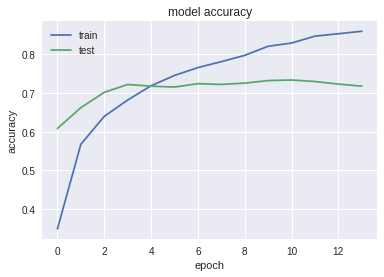

In [131]:
# summarize history for accuracy
import matplotlib.pyplot as plt
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

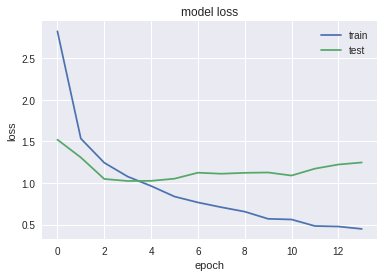

In [132]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='best')
plt.show()

In [0]:
###

### Data analysis

In [0]:
pred_probas = model_final.predict_generator(validation_generator)

In [0]:
#Misc value
maxval = [arr[index] for arr, index in zip(pred_probas, np.argsort(pred_probas, axis=1)[:,-1])]
predict = np.argsort(pred_probas, axis=1)[:,-1]
secondval = [arr[index] for arr, index in zip(pred_probas, np.argsort(pred_probas, axis=1)[:,-2])]

In [0]:
indexlabel = {v:k[10:] for k,v in train_generator.class_indices.items()}

In [83]:
import pandas as pd
resultset = pd.DataFrame(data=pred_probas, columns = range(len(indexlabel)))
resultset = pd.concat([resultset, pd.DataFrame(data={'True': validation_generator.classes,
                                                     'maxval' : maxval,
                                                     'predict': predict,
                                                     'secondval': secondval,
                                                     #'breedname': X_test.breedname.tolist(),
                                                     'filepath': validation_generator.filenames})], axis=1)
resultset['correct'] = resultset['True'] == resultset['predict']
resultset['breedname'] = resultset['True'].apply(lambda x: indexlabel.get(x, -1))
resultset['diff'] = resultset['maxval'] - resultset['secondval']
resultset.head()

,0,1,2,3,4,5,6,7,8,9,...,118,119,True,filepath,maxval,predict,secondval,correct,breedname,diff
0,0.065190,1.792914e-11,9.454017e-07,3.237894e-08,4.626903e-11,4.536801e-09,4.284844e-08,0.000182,1.350843e-10,6.992684e-12,...,2.128892e-09,2.055281e-10,0,n02085620-Chihuahua/n02085620_10074.jpg,0.931090,111,0.065190,False,Chihuahua,0.865900
1,0.999958,1.114717e-11,3.901130e-08,1.508909e-10,3.710321e-12,1.730338e-05,3.829794e-08,0.000015,6.837614e-12,1.114828e-14,...,5.780844e-09,3.127474e-12,0,n02085620-Chihuahua/n02085620_10131.jpg,0.999958,0,0.000017,True,Chihuahua,0.999940
2,0.778611,6.893232e-08,4.514859e-04,2.150181e-05,7.244615e-07,4.060980e-08,1.463801e-07,0.200021,5.688112e-08,1.324417e-10,...,5.602042e-06,1.468196e-07,0,n02085620-Chihuahua/n02085620_1073.jpg,0.778611,0,0.200021,True,Chihuahua,0.578589
3,0.029825,9.837570e-07,9.662397e-01,5.948981e-09,1.721045e-10,1.657333e-07,2.212601e-08,0.000002,6.985472e-08,2.596569e-09,...,5.587892e-12,1.562747e-13,0,n02085620-Chihuahua/n02085620_11337.jpg,0.966240,2,0.029825,False,Chihuahua,0.936415
4,0.232118,1.974069e-09,7.439154e-01,2.224466e-11,1.326504e-08,1.697907e-07,1.008713e-07,0.007672,2.727185e-10,2.302278e-10,...,5.881647e-12,7.221380e-13,0,n02085620-Chihuahua/n02085620_11477.jpg,0.743915,2,0.232118,False,Chihuahua,0.511797


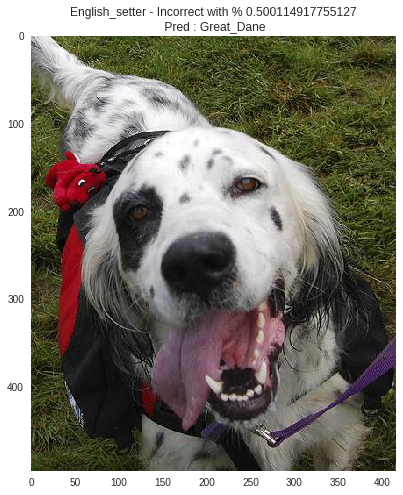

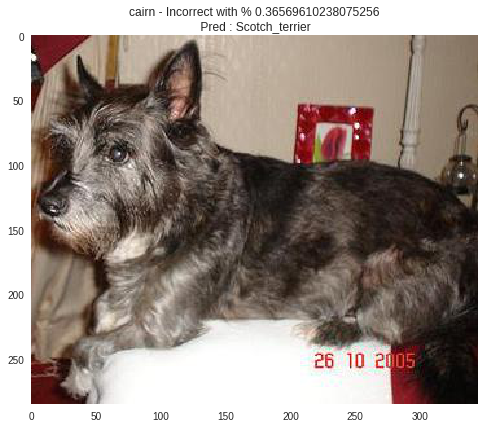

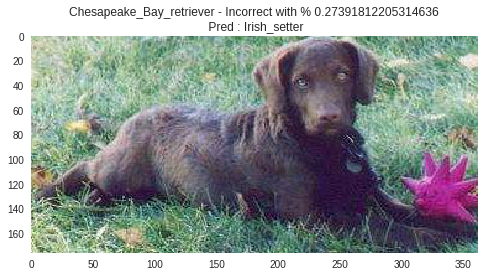

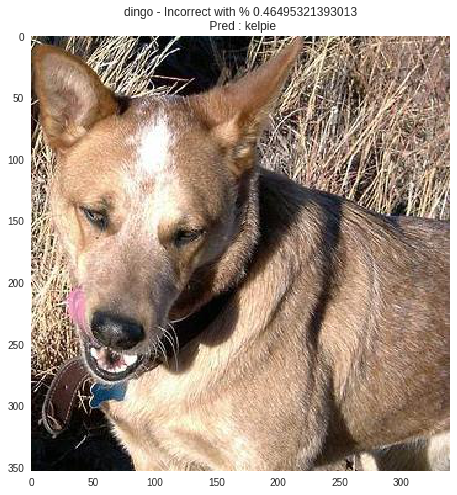

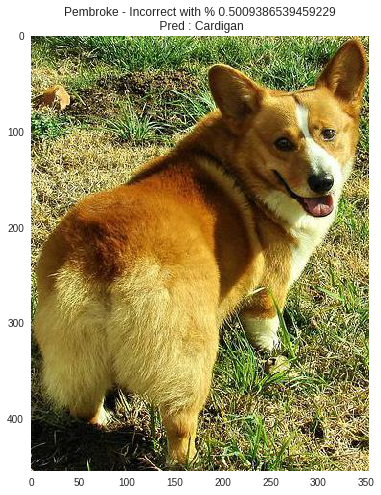

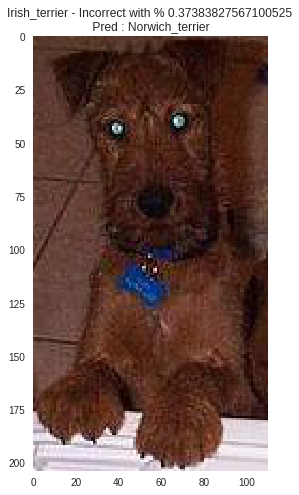

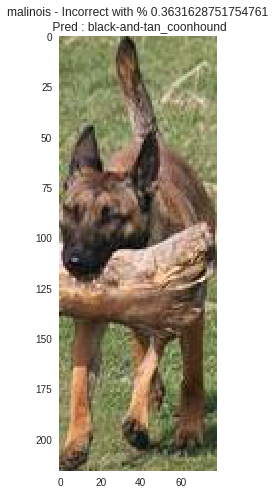

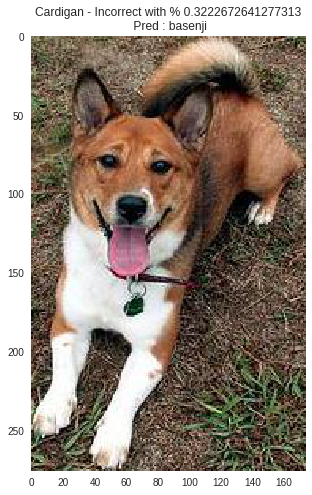

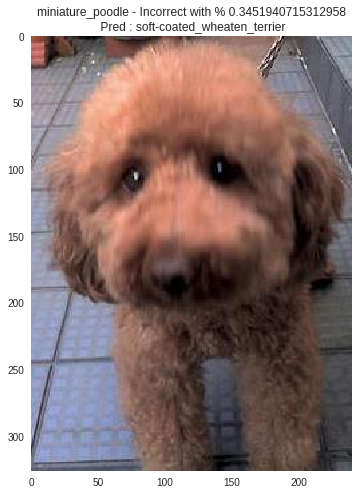

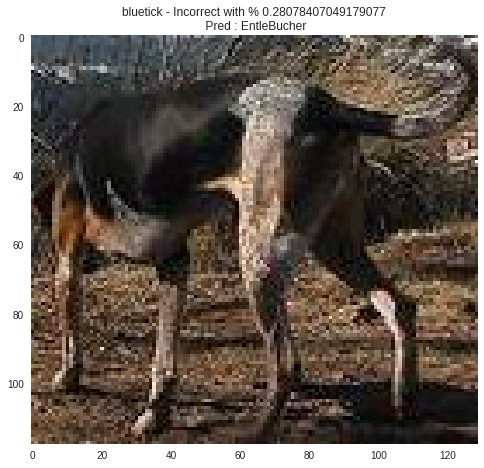

In [84]:
#Most uncertain WRONG
%matplotlib inline
ds = resultset[np.logical_not(resultset['correct'])]
ds = ds.sort_values('diff', ascending=True)
for index, line in ds[:10].iterrows():
    toopen = 'test/{}'.format(line.filepath)
    
    if toopen:
        plt.figure(figsize=(8,8))
        picture = imread(toopen)
        plt.imshow(picture)
        plt.grid(False)
        plt.title('{} - Incorrect with % {}\n Pred : {}'.format(line.breedname, line.maxval, indexlabel.get(line.predict)))
        plt.show()
    else:
        print('Picture not found')

    #print('{} - Correct with % {}'.format(line.breedname, line.maxval))

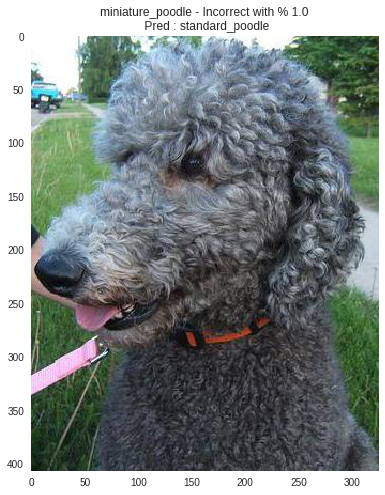

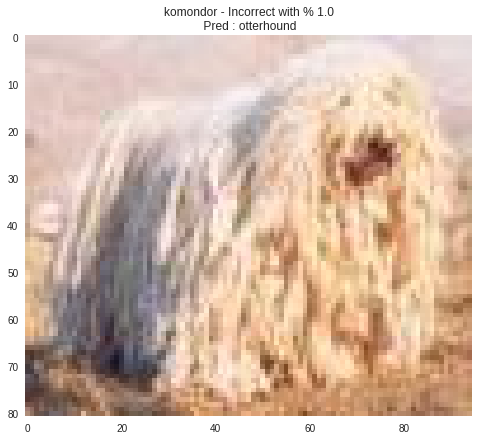

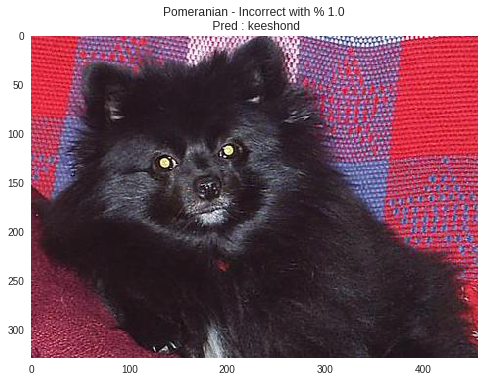

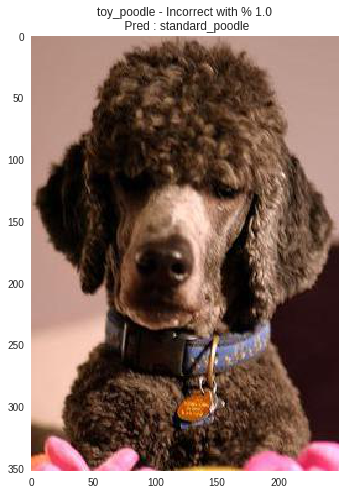

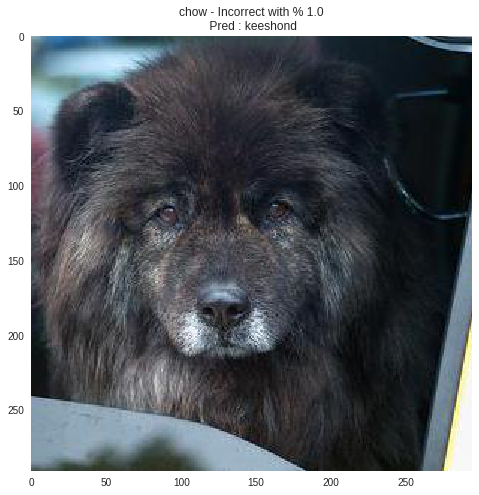

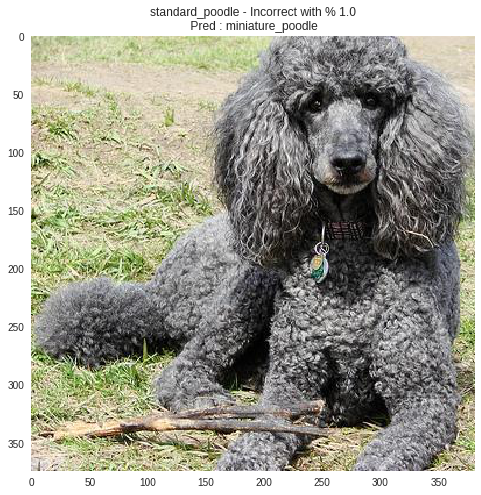

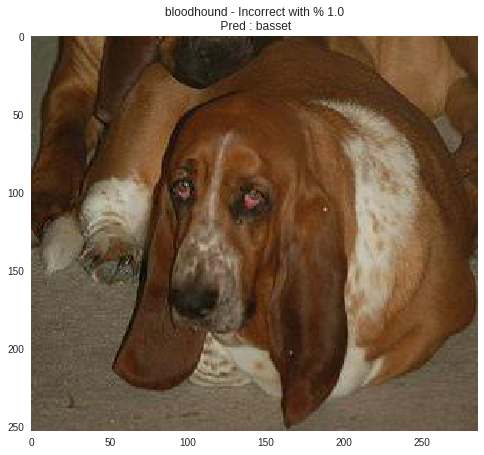

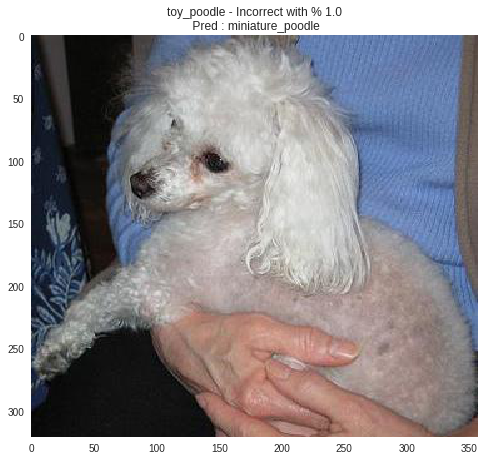

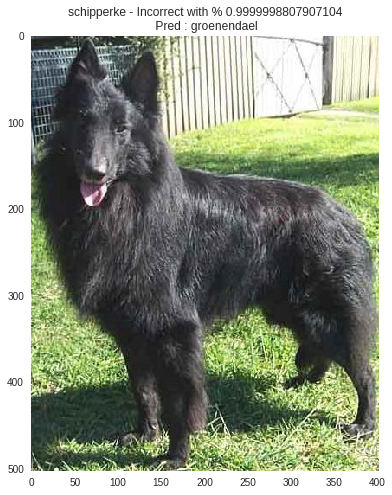

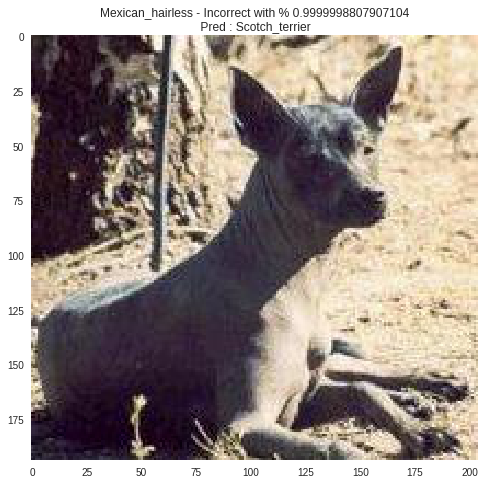

In [85]:
#Most wrong
%matplotlib inline
ds = resultset[np.logical_not(resultset['correct'])]
ds = ds.sort_values('maxval', ascending=False)
for index, line in ds[:10].iterrows():
    toopen = 'test/{}'.format(line.filepath)
    
    if toopen:
        plt.figure(figsize=(8,8))
        picture = imread(toopen)
        plt.imshow(picture)
        plt.grid(False)
        plt.title('{} - Incorrect with % {}\n Pred : {}'.format(line.breedname, line.maxval, indexlabel.get(line.predict)))
        plt.show()
    else:
        print('Picture not found')

    #print('{} - Correct with % {}'.format(line.breedname, line.maxval))